In [1]:
import numpy  as np
import pandas as pd

import itertools
import random
import math 
import copy

import pandas_profiling

# Plotting
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import matplotlib.patches as patches
%matplotlib inline  
import seaborn as sns
sns.set(style="white")

# scikit-learn
from sklearn.dummy           import DummyClassifier
from sklearn.linear_model    import LogisticRegression
from sklearn.svm             import SVC
from sklearn.neighbors       import KNeighborsClassifier
from sklearn.tree            import DecisionTreeClassifier
from sklearn.ensemble        import RandomForestClassifier
from sklearn.ensemble        import GradientBoostingClassifier

# Supporting functions from scikit-learn
from sklearn.metrics         import confusion_matrix
from sklearn.metrics         import roc_curve
from sklearn.metrics         import roc_auc_score
from sklearn.pipeline        import Pipeline
from sklearn.preprocessing   import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.tree            import export_graphviz
from sklearn.decomposition   import PCA


# ignore some warnings 
import warnings
warnings.filterwarnings('ignore')

# Set a seed for replication
SEED = 1  # Use this anywhere a stochastic function allows you to set a seed

/anaconda3/lib/python3.6/site-packages/sklearn/ensemble/weight_boosting.py:29: DeprecationWarning: numpy.core.umath_tests is an internal NumPy module and should not be imported. It will be removed in a future NumPy release.
  from numpy.core.umath_tests import inner1d


In [2]:
file=pd.read_excel("IPO_data_to_learn.xlsx")
predict_file=pd.read_excel("IPO_data_to_predict.xlsx")

In [3]:
file.dtypes


Unnamed: 0              int64
closeDay1             float64
offerPrice            float64
rf                     object
egc                      bool
html                     bool
patRatio              float64
city                   object
issuer                 object
highTech                 bool
age                   float64
exchange               object
year                    int64
industryFF5            object
industryFF12           object
industryFF48           object
nUnderwriters           int64
sharesOfferedPerc     float64
totalProceeds           int64
manager                object
investmentReceived    float64
amountOnProspectus    float64
commonEquity          float64
sp2weeksBefore        float64
nasdaq2weeksBefore    float64
dj2weeksBefore        float64
blueSky               float64
managementFee         float64
commonEquity.1        float64
bookValue             float64
totalAssets           float64
totalRevenue          float64
netIncome             float64
roa       

In [4]:
file = file.rename(columns={"commonEquity":"commonEquity1","commonEquity.1":"commonEquity2" })

In [5]:
file.dtypes

Unnamed: 0              int64
closeDay1             float64
offerPrice            float64
rf                     object
egc                      bool
html                     bool
patRatio              float64
city                   object
issuer                 object
highTech                 bool
age                   float64
exchange               object
year                    int64
industryFF5            object
industryFF12           object
industryFF48           object
nUnderwriters           int64
sharesOfferedPerc     float64
totalProceeds           int64
manager                object
investmentReceived    float64
amountOnProspectus    float64
commonEquity1         float64
sp2weeksBefore        float64
nasdaq2weeksBefore    float64
dj2weeksBefore        float64
blueSky               float64
managementFee         float64
commonEquity2         float64
bookValue             float64
totalAssets           float64
totalRevenue          float64
netIncome             float64
roa       

In [6]:
file['exchange'].value_counts()

NASDQ    2368
NYSE      895
AMEX       67
Name: exchange, dtype: int64

In [7]:
file['industryFF5'].value_counts()

Business Equipment, Telephone and Television Transmission                                         1122
Other                                                                                              898
Healthcare, Medical Equipment, and Drugs                                                           621
Consumer Durables, NonDurables, Wholesale, Retail, and Some Services (Laundries, Repair Shops)     393
Manufacturing, Energy, and Utilities                                                               296
Name: industryFF5, dtype: int64

In [8]:
file['industryFF12'].value_counts()

Business Equipment -- Computers, Software, and Electronic Equipment          945
Healthcare, Medical Equipment, and Drugs                                     621
Finance                                                                      483
Other                                                                        462
Wholesale, Retail, and Some Services (Laundries, Repair Shops)               271
Manufacturing -- Machinery, Trucks, Planes, Off Furn, Paper, Com Printing    142
Telephone and Television Transmission                                        130
Oil, Gas, and Coal Extraction and Products                                    89
Consumer NonDurables -- Food, Tobacco, Textiles, Apparel, Leather, Toys       83
Chemicals and Allied Products                                                 39
Consumer Durables -- Cars, TV's, Furniture, Household Appliances              39
Utilities                                                                     26
Name: industryFF12, dtype: i

In [9]:
file['industryFF48'].value_counts()

Business Services                           845
Pharmaceutical Products                     409
Trading                                     221
Electronic Equipment                        190
Retail                                      158
Banking                                     145
Medical Equipment                           138
Communication                               130
Computers                                   108
Insurance                                    84
Petroleum and Natural Gas                    84
Transportation                               78
Healthcare                                   74
Wholesale                                    70
Restaraunts, Hotels, Motels                  55
Measuring and Control Equipment              44
Machinery                                    41
Entertainment                                38
Personal Services                            36
Chemicals                                    35
Real Estate                             

Will probably need to only keep 1 of these, maybe FF12?


In [11]:
file.profile_report()

In [10]:
print(file['age'].mean())
print(file['age'].mode())
print(file['age'].median())
#age is the age of the firm. Should replace mising values by the mean? Are the zeros indicating new firms?

16.184561626429478
0    3.0
dtype: float64
8.0


In [11]:
len([w for w in file['age'] if w>100])
#is it possible to have so much old companies?

53

Should do something with blue sky missing value: need to decide if really useful and, if it is, how to fill it. mean, median or mean between 1sr and 3rd quarter
Keep only industry FF12

In [12]:
print(file['blueSky'].median(), file['blueSky'].mean())

10000.0 12916.115884115885


In [13]:
file['rf'][3]

'RISK FACTORS You should carefully consider the following risks in addition to the remainder of this prospectus before purchasing our common stock. The risks and uncertainties described below are intended to highlight risks that are specific to us and are not the only ones that we face. Additional risks and uncertainties, such as those that generally apply to business enterprises in our industry, also may impair our business operations. Our future profitability is uncertain due to our limited operating historyWe have a limited operating history and cannot assure you that our revenue will continue to grow or that we will maintain profitability in the future. Our prospects must be considered in light of the risks and uncertainties encountered by companies in the early stages of development. We rely substantially on sales of our MeetingPlace products, which have limited market acceptanceIn addition, we are unable to predict our future product development, sales and marketing, and administ

In [14]:
data = copy.copy(file)

In [15]:
data['age'].fillna(data['age'].median(), inplace=True)

In [16]:
data['blueSky'].fillna(data['blueSky'].median(), inplace=True)

We decide to drop the data corresponding to missing or negative values of 'closeDay1' as this feature is very important and so replacing missing values may lead to huge misinterpretation. Moreover it corresponds to only 3.5% of the data

In [17]:
data.dropna(subset=["closeDay1"], inplace=True)

In [18]:

# Drop the ID column
data = data.drop(columns = ['Unnamed: 0'], axis = 1)

In [19]:
data.shape

(3215, 46)

In [20]:
data.profile_report()

We can see that some features are highly correlated, so we will use PCA to remove the redundant features.

In [21]:

# One-hot-encode SEX and MARRIAGE  
#data = pd.get_dummies(data = data, columns = ['industryFF48', 'industryFF5','industryFF12'])

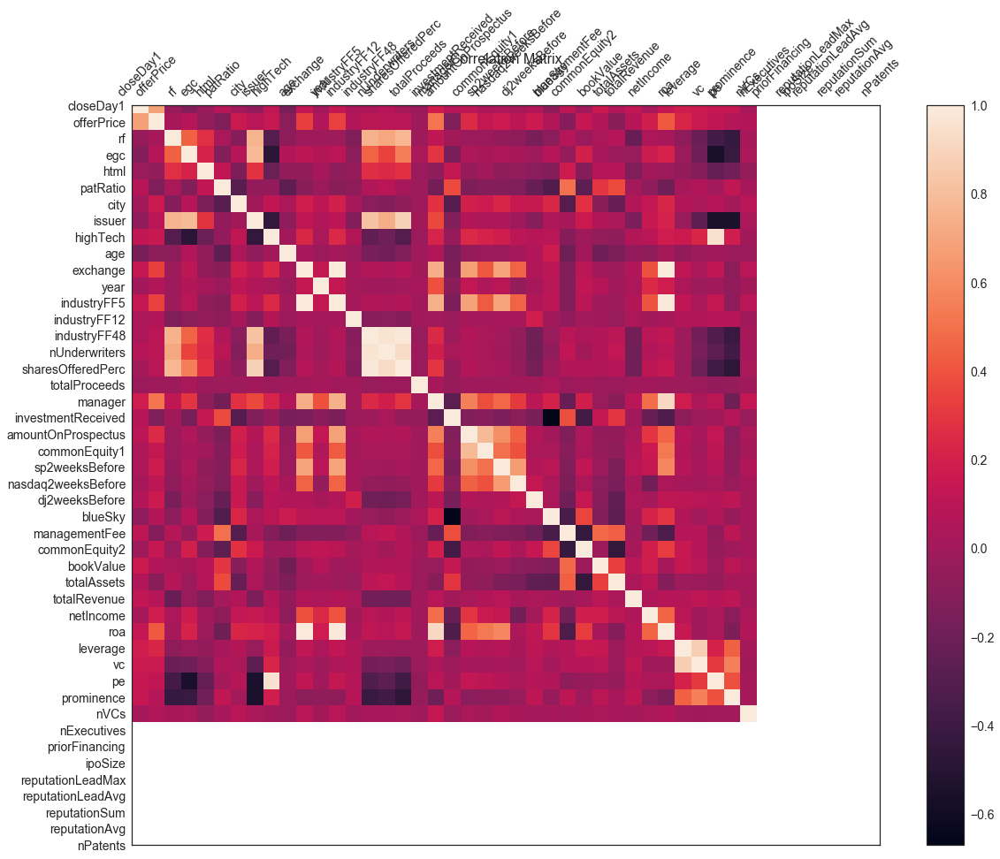

In [22]:
#Plot correlation matrix
f = plt.figure(figsize=(19, 15))
plt.matshow(data.corr(), fignum=f.number)
plt.xticks(range(data.shape[1]), data.columns, fontsize=14, rotation=45)
plt.yticks(range(data.shape[1]), data.columns, fontsize=14)
cb = plt.colorbar()
cb.ax.tick_params(labelsize=14)
plt.title('Correlation Matrix', fontsize=16);




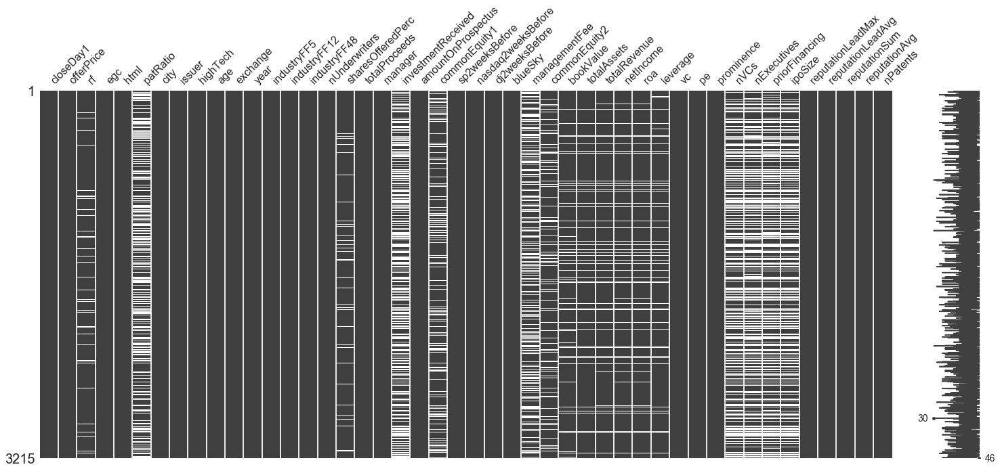

In [23]:
import missingno as msno
msno.matrix(data)

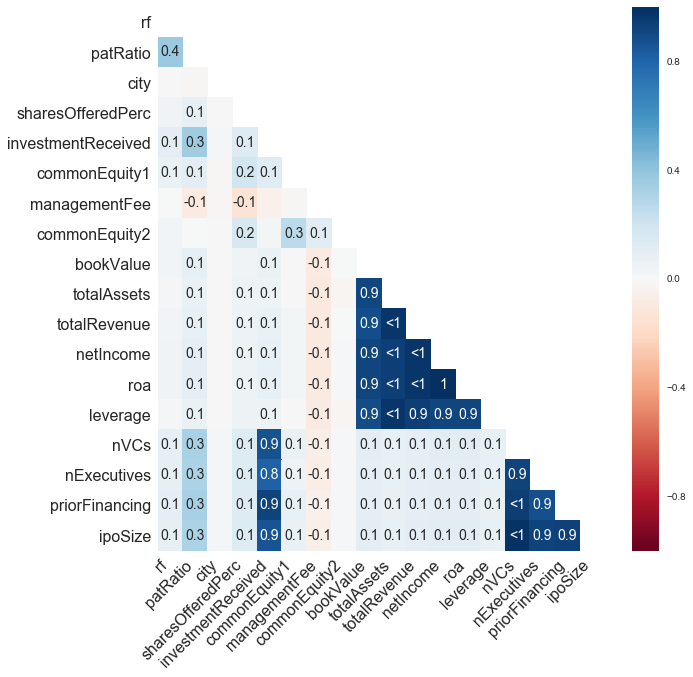

In [24]:
incomplete = data.columns[data.isnull().any()].tolist()
msno.heatmap(data[incomplete], figsize=(10,10))

In [14]:
# Move target variable to first column (not necessary, but easier to see)
data = data.set_index('closeDay1').reset_index() 

# Select target
y = np.array(data['closeDay1'])

# Select features 
features = list(set(list(data.columns)) - set(['closeDay1']))
X = data.loc[:, features]

In [17]:
# Use the sklearn train_test_split() function to split data into "train", "validation", and "test" 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2,  random_state=SEED)
X_train_train, X_train_val, y_train_train, y_train_val = train_test_split(X_train, y_train, test_size=0.25, random_state=SEED)



In [18]:
# Build pipeline
estimators = []
estimators.append(('forest_model', RandomForestClassifier()))
pipeline = Pipeline(estimators)
pipeline.set_params(forest_model__random_state=SEED)

Pipeline(memory=None,
     steps=[('forest_model', RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=1,
            oob_score=False, random_state=1, verbose=0, warm_start=False))])

In [21]:
# Tune N   
results = []
for n in [10, 50, 150, 200, 250]:
    pipeline.set_params(forest_model__n_estimators = n) 
    pipeline.fit(X_train_train, y_train_train)
    y_train_pred = pipeline.predict_proba(X_train_val)
    auc = roc_auc_score(y_train_val, y_train_pred[:,1])
    results.append( (auc, n))

# View results 
print('N'.rjust(5), '   ', 'AUC'.center(8), '\n', '=' * 20)
for (auc, n) in results:
    print('{0}'.format(n).rjust(5), '   ',  '{0:.4f}'.format(auc).center(8))   

ValueError: could not convert string to float: 'American Med Sys Holdings Inc'